<a href="https://colab.research.google.com/github/FabianoMahler/Machile-Learning/blob/master/Hepatite_C.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [33]:
!pip install dfply ## instala o pacote DFPLY
!pip install scikit-plot ## instala o pacote SCIKIT-PLOT
!pip install xgboost
!pip install graphviz
##!pip install python-graphviz
!pip install dtreeviz     
!pip install -U pandas-profiling

Requirement already up-to-date: pandas-profiling in /usr/local/lib/python3.6/dist-packages (2.8.0)


In [34]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import seaborn as sns

### biblioteca SCIKIT-LEARN
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.metrics import brier_score_loss, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler


import random

from dfply import *

import scikitplot as skplt

from dtreeviz.trees import *

import pandas_profiling


import warnings
warnings.filterwarnings("ignore")

In [35]:
from google.colab import drive
drive.mount('/content/gdrive')
df=pd.read_csv('gdrive/My Drive/HCV.csv')


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [36]:
df.head(10)

,Unnamed: 0,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,1,0=Blood Donor,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,2,0=Blood Donor,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,3,0=Blood Donor,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,4,0=Blood Donor,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,5,0=Blood Donor,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
5,6,0=Blood Donor,32,m,41.6,43.3,18.5,19.7,12.3,9.92,6.05,111.0,91.0,74.0
6,7,0=Blood Donor,32,m,46.3,41.3,17.5,17.8,8.5,7.01,4.79,70.0,16.9,74.5
7,8,0=Blood Donor,32,m,42.2,41.9,35.8,31.1,16.1,5.82,4.60,109.0,21.5,67.1
8,9,0=Blood Donor,32,m,50.9,65.5,23.2,21.2,6.9,8.69,4.10,83.0,13.7,71.3
9,10,0=Blood Donor,32,m,42.4,86.3,20.3,20.0,35.2,5.46,4.45,81.0,15.9,69.9


In [37]:
profile = pandas_profiling.ProfileReport(df)
profile
#from pandas_profiling import ProfileReport
#profile = pandas_profiling.ProfileReport(df)
#profile.to_file("output.html")

In [38]:
df_hcv = (df >>
               drop(X.columns[0])
              )

In [39]:
df_hcv.head(10)

,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,0=Blood Donor,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,0=Blood Donor,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,0=Blood Donor,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,0=Blood Donor,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,0=Blood Donor,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
5,0=Blood Donor,32,m,41.6,43.3,18.5,19.7,12.3,9.92,6.05,111.0,91.0,74.0
6,0=Blood Donor,32,m,46.3,41.3,17.5,17.8,8.5,7.01,4.79,70.0,16.9,74.5
7,0=Blood Donor,32,m,42.2,41.9,35.8,31.1,16.1,5.82,4.60,109.0,21.5,67.1
8,0=Blood Donor,32,m,50.9,65.5,23.2,21.2,6.9,8.69,4.10,83.0,13.7,71.3
9,0=Blood Donor,32,m,42.4,86.3,20.3,20.0,35.2,5.46,4.45,81.0,15.9,69.9


In [40]:
outro = df_hcv.replace({"0=Blood Donor" : "0", "0s=suspect Blood Donor" : "0", "3=Cirrhosis" : "1", "2=Fibrosis" : "1", "1=Hepatitis" : "1"}, None)

In [41]:
outro.head(600)

,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,0,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,0,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,0,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,0,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,0,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,1,56,m,27.0,81.1,17.0,319.8,37.0,1.42,3.54,66.9,93.7,65.3
596,1,56,m,23.0,105.6,5.1,123.0,43.0,1.80,2.40,62.7,35.9,62.8
597,1,56,m,30.0,40.4,0.9,80.3,119.0,1.88,1.43,79.3,17.6,54.2
598,1,58,m,31.0,143.1,7.0,181.8,58.0,3.29,3.92,66.4,273.7,78.1


In [42]:
outro = pd.get_dummies(outro, columns=['Sex'])

In [43]:
outro.head(10)

,Category,Age,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT,Sex_f,Sex_m
0,0,32,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0,0,1
1,0,32,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5,0,1
2,0,32,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3,0,1
3,0,32,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7,0,1
4,0,32,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7,0,1
5,0,32,41.6,43.3,18.5,19.7,12.3,9.92,6.05,111.0,91.0,74.0,0,1
6,0,32,46.3,41.3,17.5,17.8,8.5,7.01,4.79,70.0,16.9,74.5,0,1
7,0,32,42.2,41.9,35.8,31.1,16.1,5.82,4.60,109.0,21.5,67.1,0,1
8,0,32,50.9,65.5,23.2,21.2,6.9,8.69,4.10,83.0,13.7,71.3,0,1
9,0,32,42.4,86.3,20.3,20.0,35.2,5.46,4.45,81.0,15.9,69.9,0,1


In [44]:
outro.isnull()

,Category,Age,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT,Sex_f,Sex_m
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,False,False,False,False,False,False,False,False,False,False,False,False,False,False
611,False,False,False,False,False,False,False,False,False,False,False,False,False,False
612,False,False,False,False,False,False,False,False,False,False,False,False,False,False
613,False,False,False,True,False,False,False,False,False,False,False,False,False,False


In [45]:
hcv = outro.fillna(method ='pad') 



In [46]:
hcv.isnull()

,Category,Age,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT,Sex_f,Sex_m
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,False,False,False,False,False,False,False,False,False,False,False,False,False,False
611,False,False,False,False,False,False,False,False,False,False,False,False,False,False
612,False,False,False,False,False,False,False,False,False,False,False,False,False,False
613,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [47]:
variaveis_preditoras = hcv.iloc[:, hcv.columns != 'Category']
classe = hcv.iloc[:, hcv.columns == 'Category']
X_train, X_test, y_train, y_test = train_test_split(variaveis_preditoras, 
                                                    classe,
                                                    train_size = 0.70,
                                                    random_state = 42)

In [48]:
X_train_columns = X_train.columns

In [49]:
le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train = le.transform(y_train)
y_test = le.transform(y_test)

(array([384.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  46.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

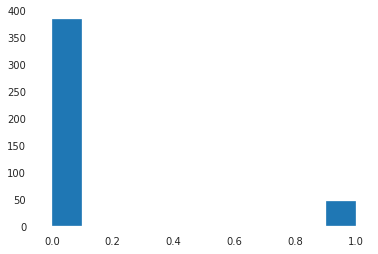

In [50]:
plt.hist(y_train)

(array([156.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  29.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

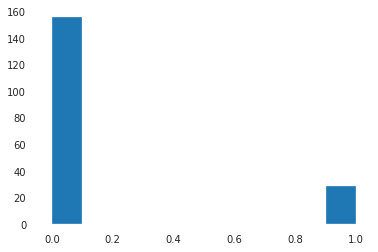

In [51]:
plt.hist(y_test)

In [52]:
from sklearn.compose import ColumnTransformer

### variáveis contínuas que serão padronizadas
continuous_cols = ['Age',	'ALB',	'ALP', 'ALT', 'AST', 'BIL', 'CHE', 'CREA', 'GGT', 'PROT']


def setScaler():
  ct = ColumnTransformer([
        ('scaler', StandardScaler(), continuous_cols)
    ], remainder='passthrough'
  )
  return ct
  
scaler = setScaler()

In [53]:
scaler.fit(X_train)

ColumnTransformer(n_jobs=None, remainder='passthrough', sparse_threshold=0.3,
                  transformer_weights=None,
                  transformers=[('scaler',
                                 StandardScaler(copy=True, with_mean=True,
                                                with_std=True),
                                 ['Age', 'ALB', 'ALP', 'ALT', 'AST', 'BIL',
                                  'CHE', 'CREA', 'GGT', 'PROT'])],
                  verbose=False)

In [54]:
X_train = scaler.transform(X_train)

In [55]:
X_test = scaler.transform(X_test)

In [56]:
pd.DataFrame(X_train, columns=X_train_columns).head(10)

,Age,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT,Sex_f,Sex_m
0,1.677378,0.483760,0.949898,-0.492336,-0.332779,0.051992,0.648331,-0.072921,-0.375922,0.445461,7.70,0.0,1.0
1,-0.355521,1.257185,-1.796475,0.400647,-0.116801,0.088497,0.376142,-0.012855,-0.199160,0.167425,4.07,0.0,1.0
2,0.152704,-1.166212,-1.315293,-0.485221,-0.436668,-0.219187,-1.317999,0.012887,-0.657346,-1.741754,5.88,1.0,0.0
3,1.779023,-0.444349,-0.956675,-0.207720,-0.215222,-0.255692,-0.520204,-0.158728,-0.210789,-1.408111,6.23,0.0,1.0
4,0.762574,1.016564,0.228124,-0.111662,-0.297239,-0.286982,0.531008,0.012887,-0.164273,0.890318,4.63,0.0,1.0
5,0.660929,0.225952,0.005690,0.254781,-0.253496,-0.328702,0.981528,0.390441,0.214835,0.742032,5.98,0.0,1.0
6,1.575733,1.016564,-0.316611,-0.278874,-0.207020,-0.151392,0.531008,-0.347505,-0.415461,0.482532,6.08,1.0,0.0
7,-0.050586,0.088454,-0.634374,-0.293105,-0.226157,0.135432,0.958063,-0.055759,-0.171250,-0.444254,5.15,0.0,1.0
8,-1.067036,0.208765,0.173650,-0.449644,-0.308174,0.229302,0.432457,0.184503,0.789312,0.278639,6.80,0.0,1.0
9,-1.168681,-0.341226,-0.675229,0.389974,-0.051188,-0.438217,0.418378,-0.090082,-0.213115,1.223961,4.18,1.0,0.0


In [57]:
def runModel(model, X_train, y_train, X_test, y_test, confusion_matrix=True, normalizeCM=False, roc=True, plot_calibration=True, random_state=42, title="", pos_label=1):
    """Função auxiliar para execução de modelos de classificação.
    
    Parâmetros:
    
    - model: modelo de classificação a ser executado
    - X_train: base de treinamento das variáveis preditoras
    - y_train: base de treinamento da classe
    - X_test: base de teste das variáveis preditoras
    - y_test: base de teste da classe
    - confusion_matrix (default: True): exibir a matriz de confusão da classificação
    - normalizeCM (default: False): define se a matriz de confusão será normalizada
    - roc (default: True): define se será exibida a curva ROC para o classificador
    - plot_calibration (default: True): define se será exibida a curva de calibração para o classificador
    - title: define o título a ser exibido nos gráficos
    - pos_label: indica qual o valor de y_train e y_test que representa a classe positiva. O valor default é 1. 

    """
    clf = model
    name = title
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
        
    if hasattr(clf, "predict_proba"):
        prob_pos = clf.predict_proba(X_test)
    else:  # use decision function
        prob_pos = clf.decision_function(X_test)
        prob_pos = (prob_pos - prob_pos.min()) / (prob_pos.max() - prob_pos.min())
    if confusion_matrix:
       skplt.metrics.plot_confusion_matrix(y_test, y_pred, normalize=normalizeCM, title=name)
    if roc:
       skplt.metrics.plot_roc(y_test, prob_pos, plot_micro=False, plot_macro=False, classes_to_plot=[1], title=name,figsize=(10,10))
               
    prob_pos = prob_pos[:,1]
    clf_score = brier_score_loss(y_test, prob_pos, pos_label=pos_label)
    print("%s:" % name)
    print("\tBrier: %1.3f" % (clf_score))
    print("\tPrecision: %1.3f" % precision_score(y_test, y_pred))
    print("\tRecall: %1.3f" % recall_score(y_test, y_pred))
    print("\tF1: %1.3f\n" % f1_score(y_test, y_pred))
        
    if plot_calibration:
      
      fraction_of_positives, mean_predicted_value = \
                calibration_curve(y_test, prob_pos, n_bins=10)
      plt.rcParams.update({'font.size': 22})
      plt.rc('legend',**{'fontsize':22})
      fig = plt.figure(3, figsize=(10, 10))
      ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
      ax2 = plt.subplot2grid((3, 1), (2, 0))
      ax1.plot([0, 1], [0, 1], "k:", label="Perfeitamente calibrado",)
      ax1.plot(mean_predicted_value, fraction_of_positives, "s-",
                     label="%s (%1.3f)" % (name, clf_score))

      ax2.hist(prob_pos, range=(0, 1), bins=10, label=name,
                     histtype="step", lw=2)

      ax1.set_ylabel("Fração de positivos")
      ax1.set_ylim([-0.05, 1.05])
      ax1.legend(loc="lower right")
      ax1.set_title('Gráfico de Calibração  (reliability curve)')
      
      ax2.set_xlabel("Valor médio predito")
      ax2.set_ylabel("Quantidade")
      ax2.legend(loc="upper center", ncol=2)
      
      for item in ([ax1.title, ax1.xaxis.label, ax1.yaxis.label] +
             ax1.get_xticklabels() + ax1.get_yticklabels()):
        item.set_fontsize(22)
        
      for item in ([ax2.title, ax2.xaxis.label, ax2.yaxis.label] +
             ax2.get_xticklabels() + ax2.get_yticklabels()):
        item.set_fontsize(22)
      
      plt.tight_layout()
      plt.show()

    
    
    

# regressão logística

In [58]:
# Utility function to report best scores
def report(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})".format(
                  results['mean_test_score'][candidate],
                  results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")

Regressão Logística:
	Brier: 0.067
	Precision: 0.889
	Recall: 0.552
	F1: 0.681



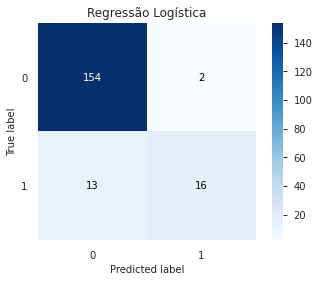

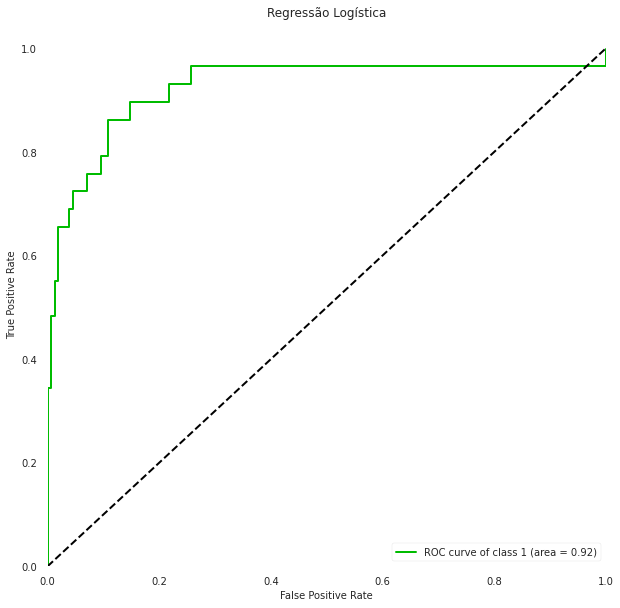

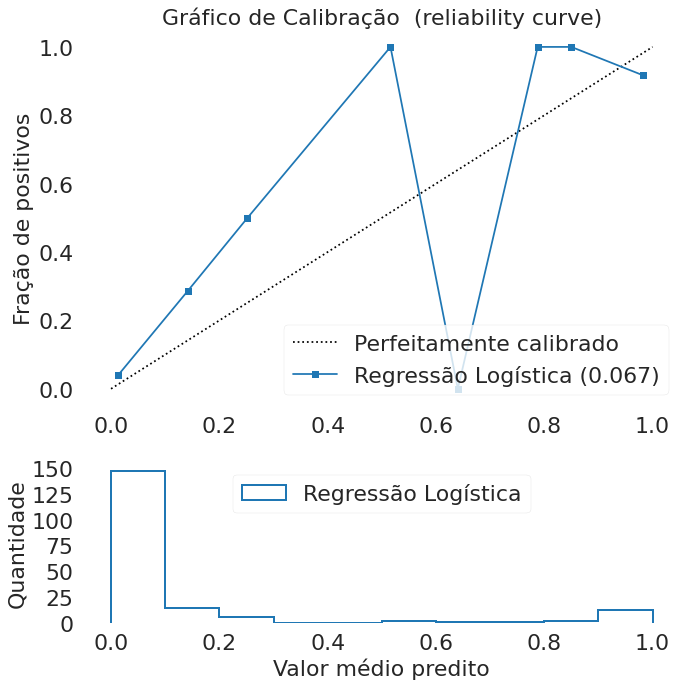

In [59]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
runModel(lr, X_train, y_train, X_test, y_test, title="Regressão Logística")

# redes neurais

In [60]:
from sklearn import neural_network

In [61]:
rna = neural_network.MLPClassifier(activation='tanh', alpha=0.1, batch_size=5, beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=7, learning_rate='constant',
       learning_rate_init=0.1, max_iter=500, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=None, shuffle=True, solver='lbfgs', tol=0.0001,
       validation_fraction=0.1, verbose=True, warm_start=False)

RNA:
	Brier: 0.041
	Precision: 0.917
	Recall: 0.759
	F1: 0.830



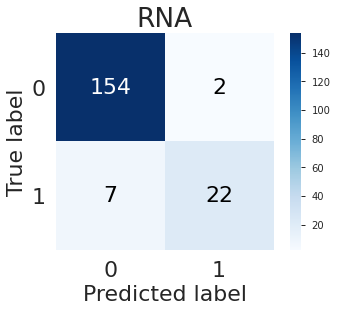

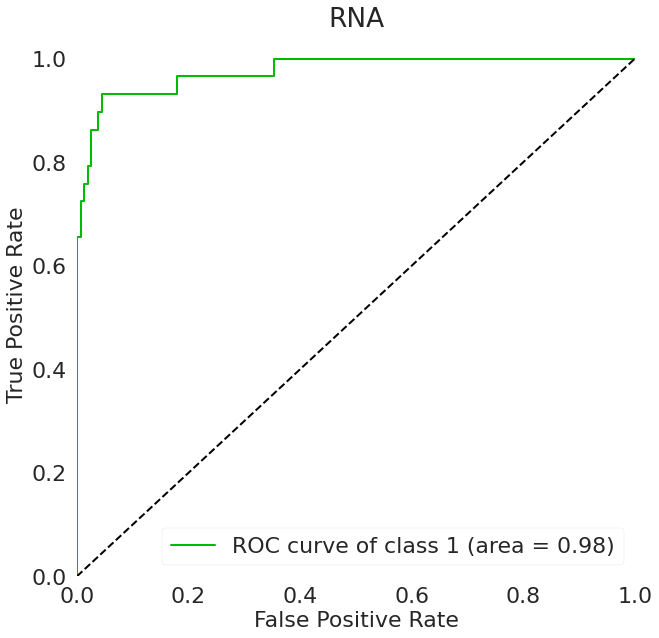

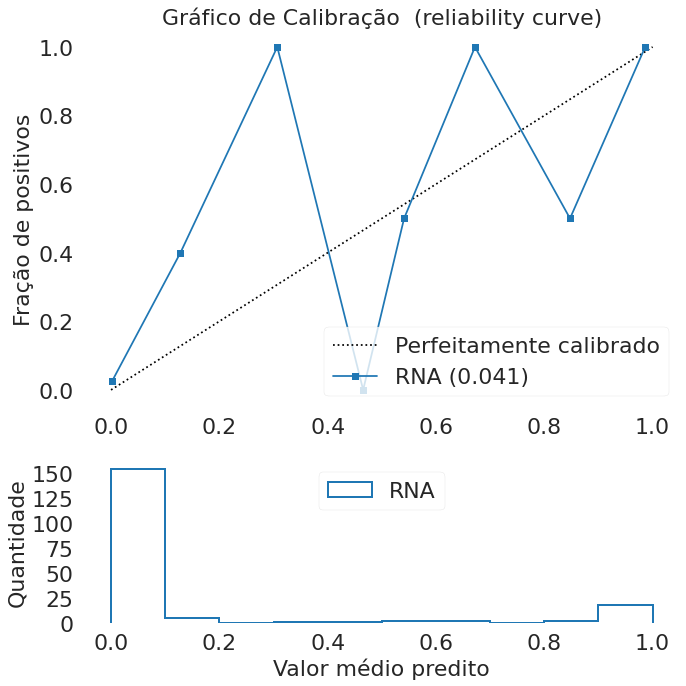

In [62]:
runModel(rna, X_train, y_train, X_test, y_test, title="RNA")

# árvore de decisões

In [63]:
from sklearn.tree import DecisionTreeClassifier
param_grid = {"criterion": ["gini", "entropy"],
              "min_samples_split": [2,5,8,15,20],
              "max_depth": [2,4,6,8,10],
              "min_samples_leaf": [1,2,4,8,10],
              "max_leaf_nodes": [2,4, 7,9, 12, 20],
              }
dt = DecisionTreeClassifier(random_state=42)
cv_dt = GridSearchCV(dt, cv = 3,
                     param_grid=param_grid,
                     n_jobs = -1)

In [64]:
cv_dt.fit(X_train, y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=42,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                       

In [65]:
report(cv_dt.cv_results_)


Model with rank: 1
Mean validation score: 0.967 (std: 0.003)
Parameters: {'criterion': 'gini', 'max_depth': 4, 'max_leaf_nodes': 7, 'min_samples_leaf': 1, 'min_samples_split': 8}

Model with rank: 1
Mean validation score: 0.967 (std: 0.003)
Parameters: {'criterion': 'gini', 'max_depth': 4, 'max_leaf_nodes': 7, 'min_samples_leaf': 1, 'min_samples_split': 15}

Model with rank: 1
Mean validation score: 0.967 (std: 0.003)
Parameters: {'criterion': 'gini', 'max_depth': 4, 'max_leaf_nodes': 7, 'min_samples_leaf': 1, 'min_samples_split': 20}

Model with rank: 1
Mean validation score: 0.967 (std: 0.003)
Parameters: {'criterion': 'gini', 'max_depth': 4, 'max_leaf_nodes': 9, 'min_samples_leaf': 1, 'min_samples_split': 8}

Model with rank: 1
Mean validation score: 0.967 (std: 0.003)
Parameters: {'criterion': 'gini', 'max_depth': 4, 'max_leaf_nodes': 9, 'min_samples_leaf': 1, 'min_samples_split': 15}

Model with rank: 1
Mean validation score: 0.967 (std: 0.003)
Parameters: {'criterion': 'gini', 'm

In [66]:
dt = DecisionTreeClassifier(criterion='entropy', max_depth=6, max_leaf_nodes=20, min_samples_leaf=10, min_samples_split=20)

Árvore de Decisão:
	Brier: 0.061
	Precision: 0.769
	Recall: 0.690
	F1: 0.727



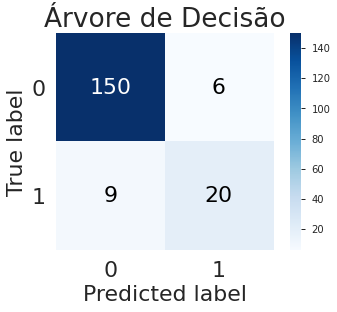

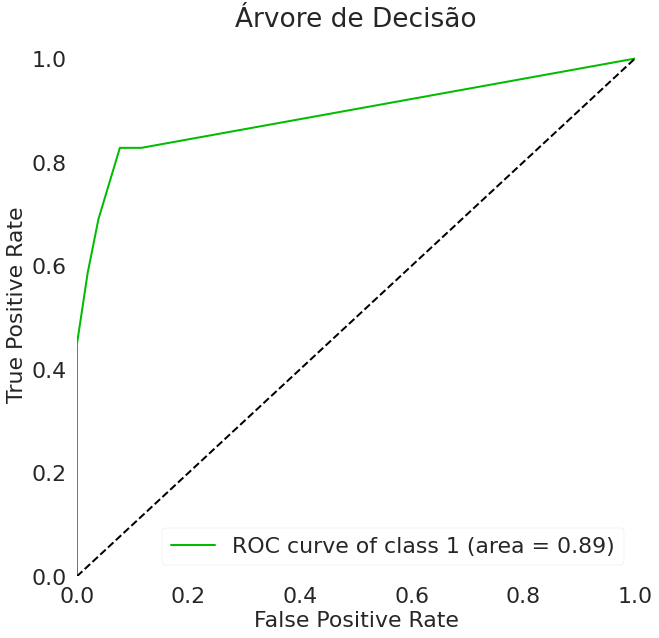

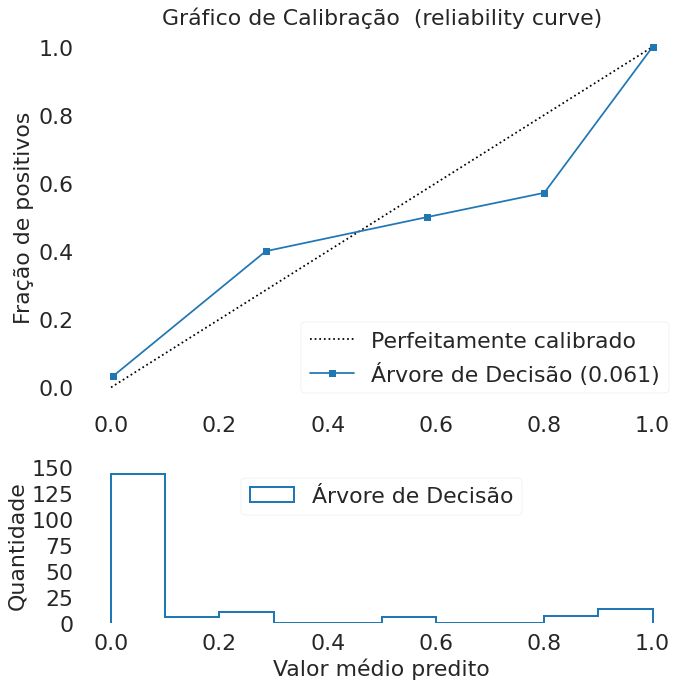

In [67]:
runModel(dt, X_train, y_train, X_test, y_test, title="Árvore de Decisão")

# random forest

In [68]:
fit_rf = RandomForestClassifier(random_state=42, verbose=1)


In [69]:
np.random.seed(42)

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 5)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 20, num = 5)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the param grid
param_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

### Caso deseje rodar GridSearchCV, troque a linha acima pela que segue

cv_rf = GridSearchCV(fit_rf, cv=3, param_grid=param_grid,
                     n_jobs = -1) 

cv_rf = RandomizedSearchCV(fit_rf, n_iter=50, cv=3, verbose=1, param_distributions=param_grid,
                     n_jobs = -1)



In [70]:
cv_rf.fit(X_train, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   36.5s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:  1.7min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [71]:
rf = cv_rf.best_estimator_

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


Random Forest:
	Brier: 0.034
	Precision: 0.957
	Recall: 0.759
	F1: 0.846



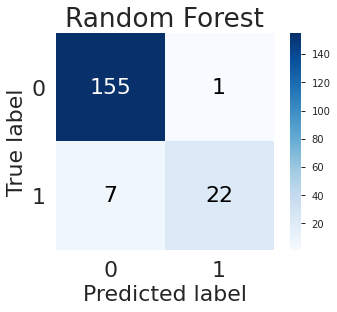

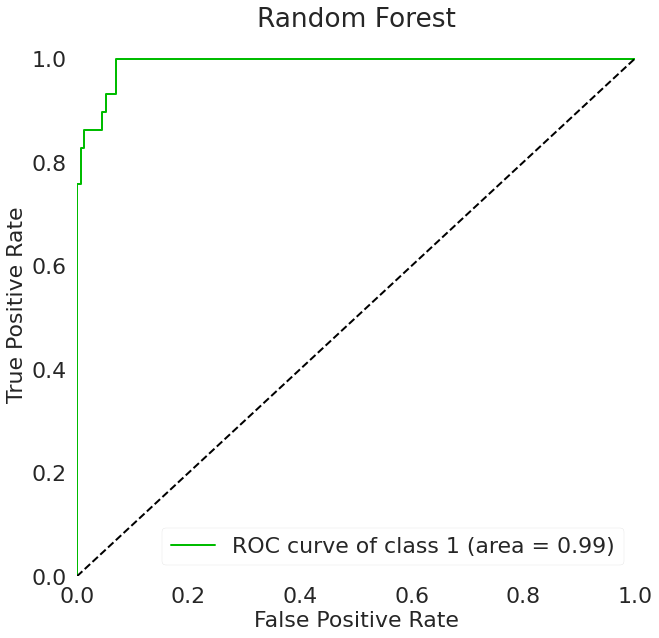

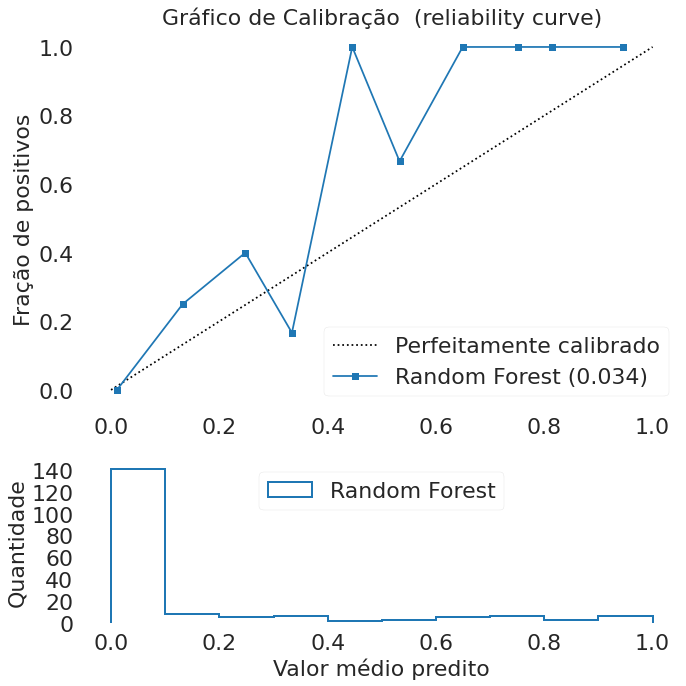

In [72]:
runModel(rf, X_train, y_train, X_test, y_test, title="Random Forest")